# Exploratory Data Analysis - Customer Loans in Finance

In [1]:
import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot
from statsmodels.graphics.gofplots import qqplot
from scipy import stats
from sklearn.preprocessing import PowerTransformer
import statsmodels.api as sm


### Converting columns to the correct format

In [2]:
# Importing DataTransform class from db_transform
from db_transform import DataTransform 

df = pd.read_csv('/Users/maria/AiCore_Projects/exploratory-data-analysis---customer-loans-in-finance914/loan_payments_data.csv')

# Creating an instance of the DataTransform Class
data_transformer = DataTransform(df)

# Defining the columns to be converted
numeric_columns = ['collections_12_mths_ex_med']
object_columns = ['purpose', 'application_type']
date_columns = ['issue_date', 'last_payment_date', 'next_payment_date', 'last_credit_pull_date', 'earliest_credit_line']
category_columns = ['grade', 'sub_grade', 'home_ownership', 'verification_status']
bool_columns = ['payment_plan']
employment_columns = ['employment_length']

# Transforming the columns
data_transformer.convert_to_int(numeric_columns)
data_transformer.convert_to_object(object_columns)
data_transformer.convert_to_date(date_columns)
data_transformer.convert_to_category(category_columns)
data_transformer.convert_to_bool(bool_columns)
data_transformer.convert_employment_length(employment_columns)

### Created DataFrameInfo class to get information from the DataFrame

In [3]:
# Importing DataTransform class from db_info
from db_info import DataFrameInfo

# Creating an instance of the DataFrameInfo Class
db_info = DataFrameInfo(df)

print(db_info.describe_columns())
print(db_info.extract_stats())
print(db_info.df_shape())
print(db_info.null_values())
print(db_info.distinct_values())

id                                      int64
member_id                               int64
loan_amount                             int64
funded_amount                         float64
funded_amount_inv                     float64
term                                    Int64
int_rate                              float64
instalment                            float64
grade                                category
sub_grade                            category
employment_length                       Int64
home_ownership                       category
annual_inc                            float64
verification_status                  category
issue_date                     datetime64[ns]
loan_status                            object
payment_plan                             bool
purpose                                object
dti                                   float64
delinq_2yrs                             int64
earliest_credit_line           datetime64[ns]
inq_last_6mths                    

### Visualising insights from the data

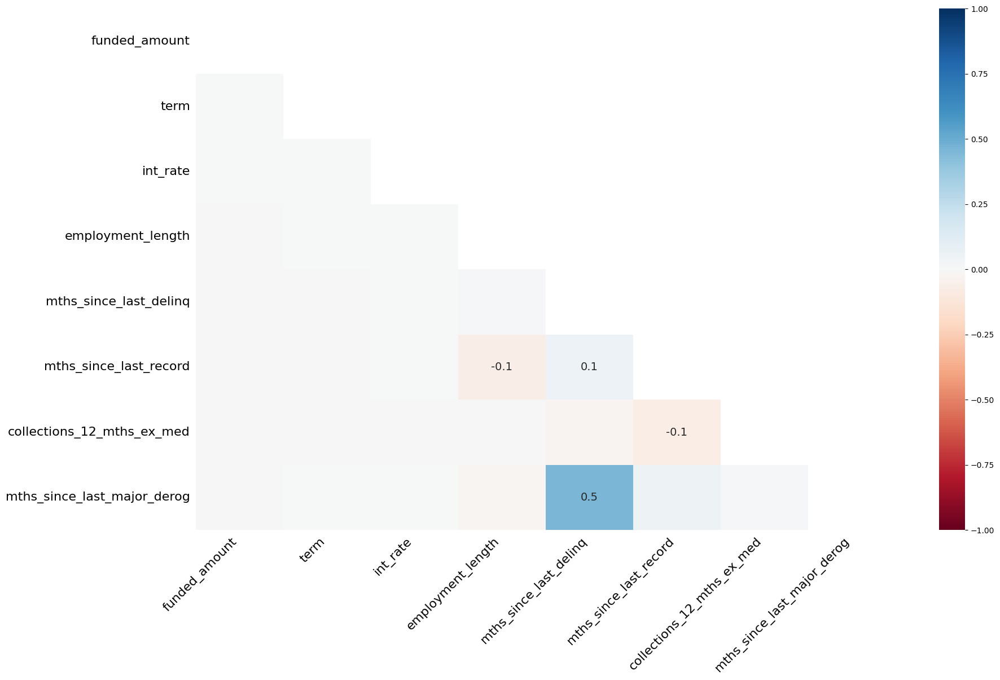

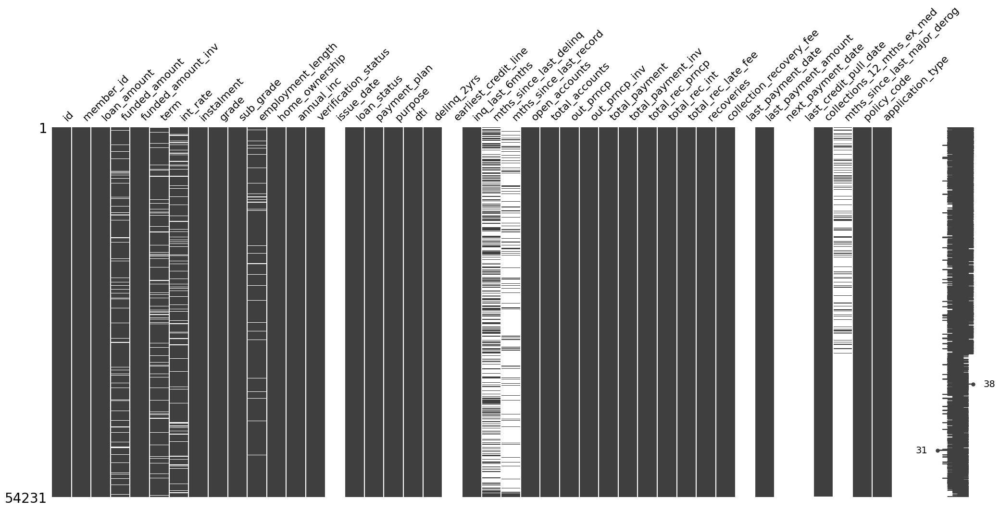

In [4]:
# Importing Plotter class from db_plotter
from db_plotter import Plotter

# Creating an instance of the Plotter Class
data_plotter = Plotter()

# Heatmap method
data_plotter.null_heatmap(df)

# Matrix method
data_plotter.null_matrix(df)


### Median and Mean

In [5]:
# Funded_amount
print(f'The median of the funded amount is {df["funded_amount"].median()}')
print(f'The mean of the funded amount is {df["funded_amount"].mean()}')

# Term
print(f'The median of the term is {df["term"].median()}')
print(f'The mode of the term is {df["term"].mode()}')

# Interest rate 
print(f'The median of the interest rate is {df["int_rate"].median()}')
print(f'The mean of the interest rate is {df["int_rate"].mean()}')

# Employment length 
print(f'The median of the employment length is {df["employment_length"].median()}')
print(f'The mean of the employment length is {df["employment_length"].mean()}')
print(f'The mode of the employment length is {df["employment_length"].mode()}')

The median of the funded amount is 12000.0
The mean of the funded amount is 13229.50911682024
The median of the term is 36.0
The mode of the term is 0    36
Name: term, dtype: Int64
The median of the interest rate is 13.16
The mean of the interest rate is 13.507328482328484
The median of the employment length is 6.0
The mean of the employment length is 5.7873467273041275
The mode of the employment length is 0    10
Name: employment_length, dtype: Int64


### Removing/Imputing missing values in the data

id                              0.000000
member_id                       0.000000
loan_amount                     0.000000
funded_amount                   0.000000
funded_amount_inv               0.000000
term                            0.000000
int_rate                        0.000000
instalment                      0.000000
grade                           0.000000
sub_grade                       0.000000
employment_length               0.000000
home_ownership                  0.000000
annual_inc                      0.000000
verification_status             0.000000
issue_date                    100.000000
loan_status                     0.000000
payment_plan                    0.000000
purpose                         0.000000
dti                             0.000000
delinq_2yrs                     0.000000
earliest_credit_line          100.000000
inq_last_6mths                  0.000000
open_accounts                   0.000000
total_accounts                  0.000000
out_prncp       

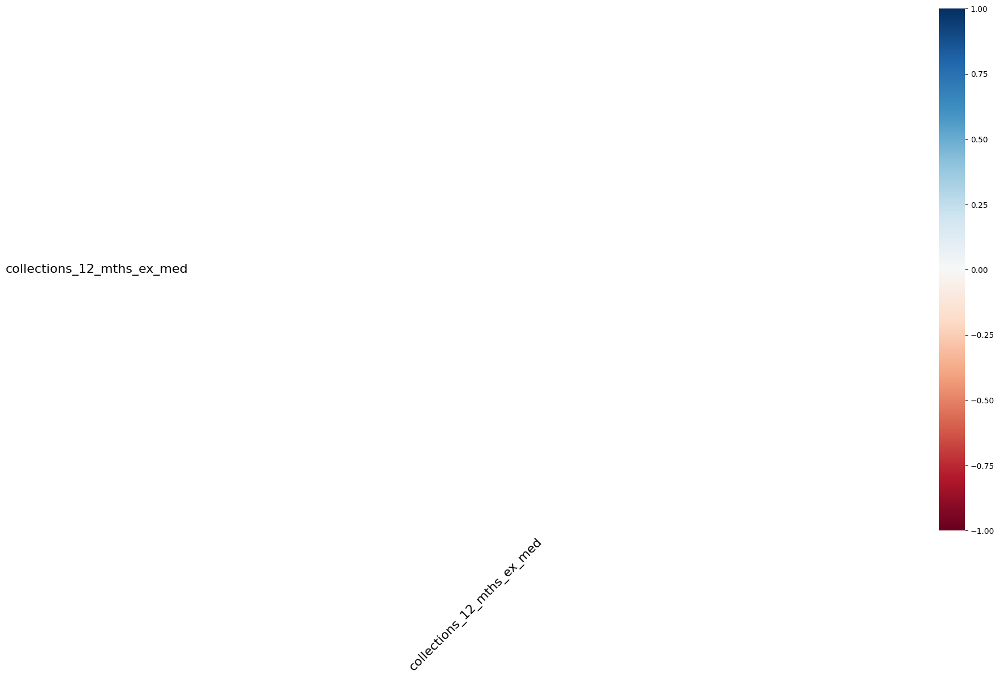

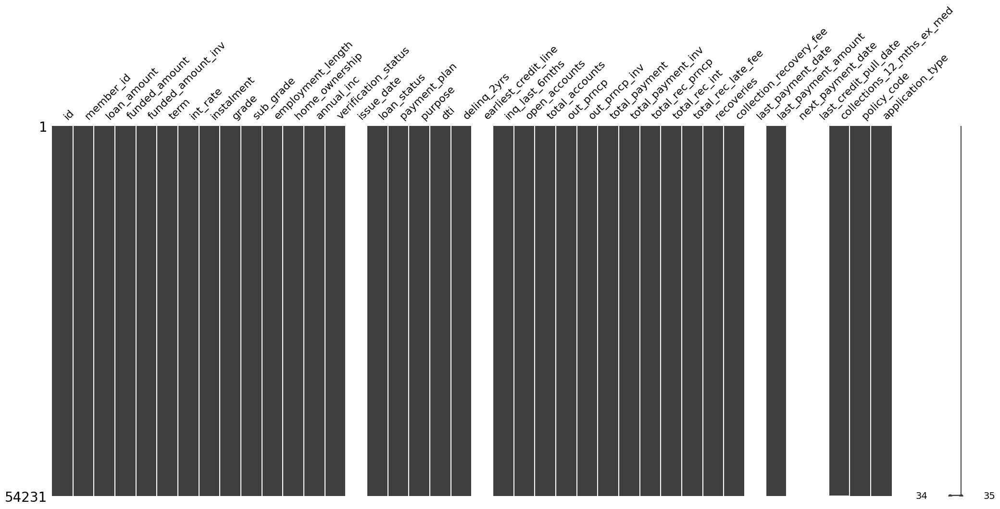

In [6]:
# Importing DataFrameTransform class from db_null_transform
from db_null_transform import DataFrameTransform

# Creating an instance of the DataFrameTransform Class
df_transform = DataFrameTransform

# Impute missing values with median
columns_to_impute = ['funded_amount', 'term', 'int_rate', 'employment_length']
df_imputed_values = df_transform.impute_missing_values(df, columns_to_impute)

# Dropping columns with > 50% missing values 
columns_to_drop = ['mths_since_last_delinq', 'mths_since_last_record', 'mths_since_last_major_derog']
df_dropped_cols = df_transform.drop_columns(df, columns_to_drop)

# Print missing data after imputing
print(df_transform.check_nulls(df_dropped_cols))

# Heatmap method after imputing
data_plotter.null_heatmap(df_dropped_cols)

# Matrix method after imputing 
data_plotter.null_matrix(df_dropped_cols)

### Identifying skewed columns

id                             2.370336
member_id                      2.205422
loan_amount                    0.805259
funded_amount                  0.869922
funded_amount_inv              0.813927
term                           1.148358
int_rate                       0.456515
instalment                     0.996981
employment_length             -0.038738
annual_inc                     8.711831
dti                            0.189420
delinq_2yrs                    5.370002
inq_last_6mths                 3.248918
open_accounts                  1.059282
total_accounts                 0.779014
out_prncp                      2.356426
out_prncp_inv                  2.356848
total_payment                  1.267891
total_payment_inv              1.256197
total_rec_prncp                1.261015
total_rec_int                  2.204322
total_rec_late_fee            13.184305
recoveries                    14.589793
collection_recovery_fee       27.636843
last_payment_amount            2.499381


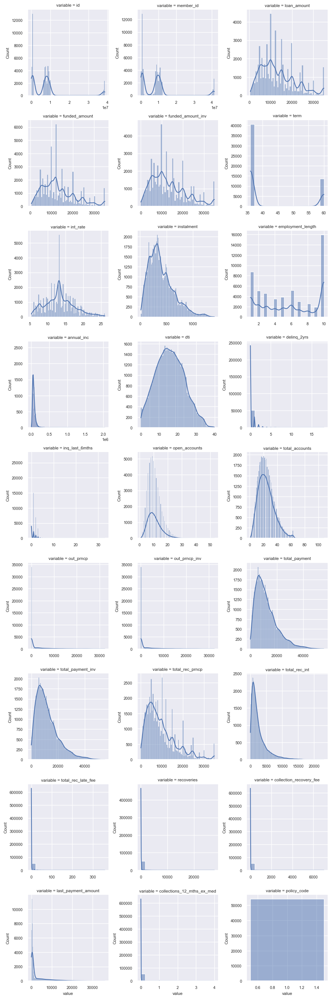

In [7]:
# Skew threshold 
skew_threshold = 0.5

skewed_columns = df_dropped_cols.select_dtypes(include=['float64', 'int64']).columns
skewness = df_dropped_cols[skewed_columns].apply(lambda x: x.skew())
print(skewness)

# Visualising the original skews
categorical_features = [col for col in df.columns if col not in skewed_columns]
sns.set(font_scale=0.7)
f_original = pd.melt(df_dropped_cols, value_vars=skewed_columns)
g_original = sns.FacetGrid(f_original, col="variable",  col_wrap=3, sharex=False, sharey=False)
g_original = g_original.map(sns.histplot, "value", kde=True)
print(categorical_features)

### Performing transformations on skewed columns

In [8]:
# Testing the class methods 
skewed_columns = df_dropped_cols.select_dtypes(include=['float64', 'int64']).columns

In [9]:
# Applying Box-Cox transformation
df_transformed = DataFrameTransform.apply_boxcox_transformation(df_dropped_cols, skewed_columns)

/usr/local/Caskroom/miniconda/base/envs/my_eda_env/lib/python3.11/site-packages/numpy/core/_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


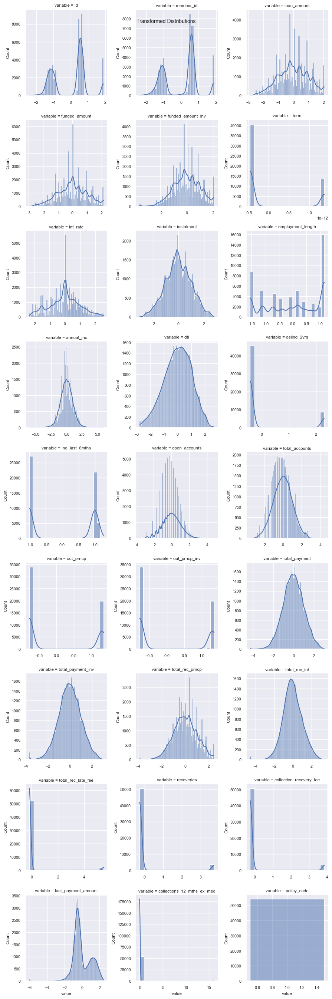

In [10]:
# Visualising transformed distributions
sns.set(font_scale=0.7)
f_transformed = pd.melt(df_transformed, value_vars=skewed_columns)
g_transformed = sns.FacetGrid(f_transformed, col="variable", col_wrap=3, sharex=False, sharey=False)
g_transformed = g_transformed.map(sns.histplot, "value", kde=True)
plt.suptitle("Transformed Distributions")

plt.show()

### Determining outliers

In [11]:
df_without_outliers = DataFrameTransform.zscore_outliers(df_dropped_cols)

# Display the DataFrame with Z-scores and outliers
print("Z-scores and Outliers:")
sns.pairplot(df_without_outliers)

/Users/maria/AiCore_Projects/exploratory-data-analysis---customer-loans-in-finance914/db_null_transform.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_numeric[df_numeric.columns] = z_scores


Z-scores and Outliers:


### Dropping overly correlated columns

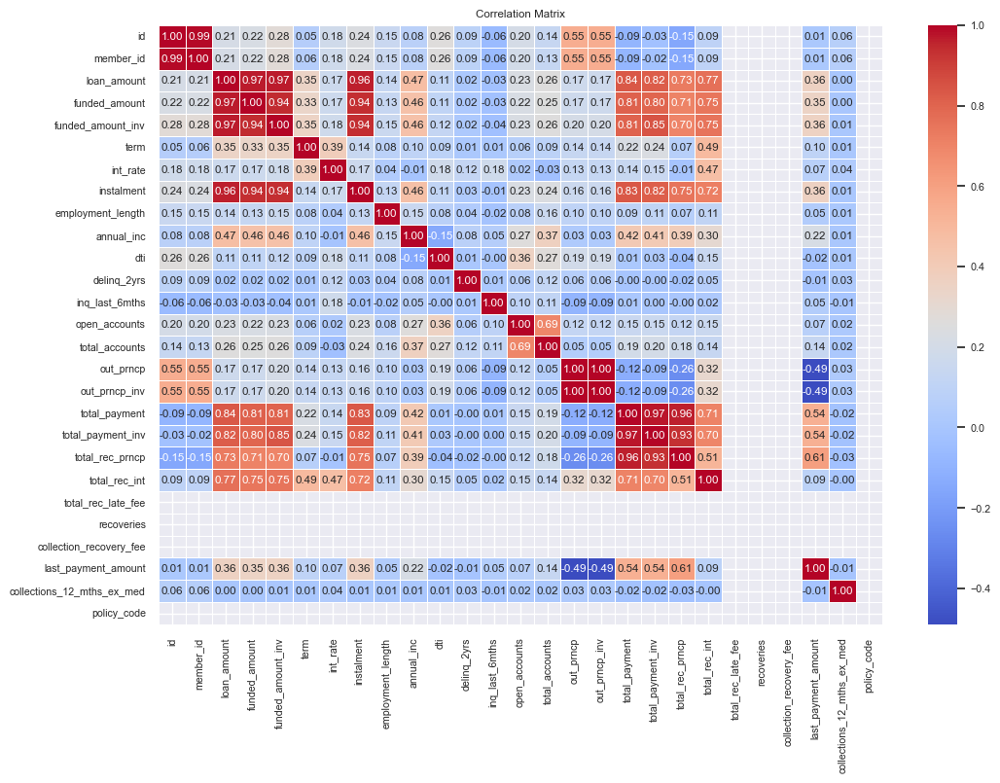

In [12]:
# Visualising the correlation matrix

Plotter.visualise_correlation(df_without_outliers)


In [13]:
highly_correlated_cols = Plotter.identify_highly_correlated(df_without_outliers, threshold=0.8)
print("Highly Correlated Columns:", highly_correlated_cols)

Highly Correlated Columns: ['member_id', 'funded_amount', 'funded_amount_inv', 'instalment', 'out_prncp_inv', 'total_payment', 'total_payment_inv', 'total_rec_prncp']


In [ ]:
# Dropping Highly Correlated Columms (Threshold over 0.8)
high_correlated_columns = ['member_id', 'funded_amount', 'funded_amount_inv', 'instalment', 'out_prncp_inv', 'total_payment', 'total_payment_inv', 'total_rec_prncp']

# Removing highly correlated columns
df_no_high_corr = df_without_outliers.drop(columns=high_correlated_columns)

print(df_no_high_corr)